# PIE - Using MFCC features for classification with CNN

In this notebook, we will train a CNN on MFCC 2D features

In [1]:
from pie_utils import *
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

#Classifiers and utils
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder, scale
from keras.utils import to_categorical

from sklearn import svm

from sklearn.naive_bayes import GaussianNB

from sklearn.neural_network import MLPClassifier

from keras.models import Sequential
from keras.layers import Dense, Activation
import keras.metrics as metrics
import keras.losses as losses
import keras.optimizers as optimizers

from xgboost import XGBClassifier

Using TensorFlow backend.


In [4]:
#The datapath depends on the configuration of your own folder PIE. Check your data path out !
#datapath = './' #directory where audio files are
datapath = "../../data_pie/" 

train = pd.read_csv(osp.join(datapath,"data-PIE-Sonar.csv"))

In [123]:
Y = train['label']
list_labels = train.label.unique()
list_labels.sort()

## Preliminaries : how to make audio files the same length?

There are many ways to obtain audio files of same length. First, we should focus on the distribution of length of files to find out what will be our approach. 

In [135]:
def parser_length(row,
                  data_directory_path,
                  trim=True,
                  db_cutoff=3):
    file_name = osp.join(data_directory_path, row['fname'])
    try:
        y, sr = librosa.load(file_name, res_type='kaiser_fast')
    except Exception as e:
        print('Error encountered while parsing the file:',file_name)
        print(e)
        return 'None'
    if(trim):
        y = librosa.effects.trim(y, top_db=db_cutoff)[0]
    return len(y)/sr

In [136]:
data_dir = osp.join(datapath,'audio_train')
temp = train.copy()
temp = temp.assign(audio_length=temp.apply(lambda x : parser_length(x,data_directory_path=data_dir,trim=True),axis=1))

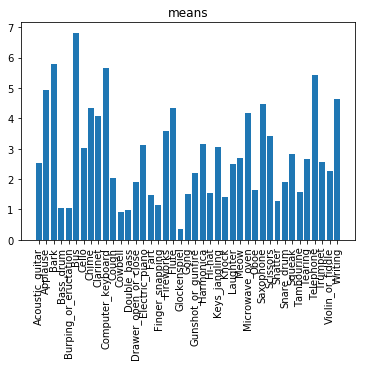

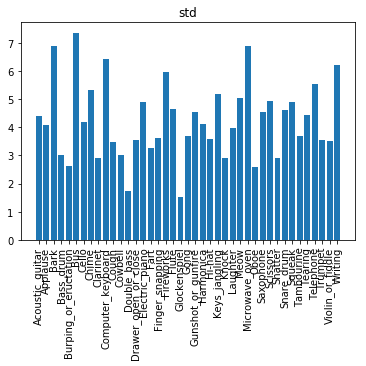

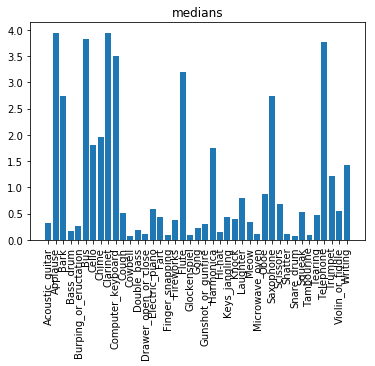

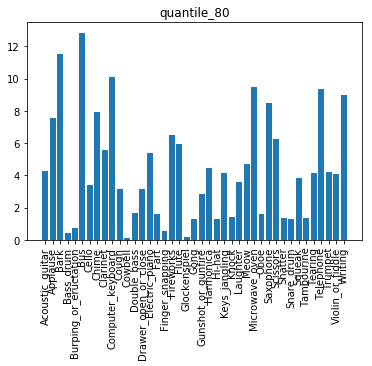

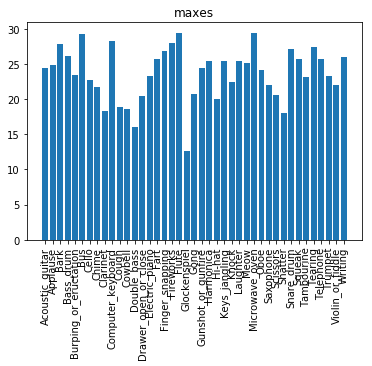

labels_high_median: 
 ['Applause', 'Bark', 'Bus', 'Cello', 'Chime', 'Clarinet', 'Computer_keyboard', 'Flute', 'Harmonica', 'Saxophone', 'Telephone', 'Trumpet', 'Writing'] 

labels_high_80th: 
 ['Applause', 'Bark', 'Bus', 'Chime', 'Clarinet', 'Computer_keyboard', 'Electric_piano', 'Fireworks', 'Flute', 'Microwave_oven', 'Saxophone', 'Scissors', 'Telephone', 'Writing'] 



In [166]:
insights = {
    'means' : [],
    'std' : [],
    'medians' : [],
    'quantile_80' : [],
    'maxes' : [],
    'labels_high_median' : [],
    'labels_high_80th' : []
}

show_details = False #switch to True if you want to see the distribution for each class

for label in list_labels:
    train_class = temp['audio_length'][temp['label']==label]
    if show_details:
        train_class.hist(bins=50,figsize=(5,5))
        plt.title(label)
        plt.show()
        print(train_class.describe())
    insights['means'].append(train_class.mean())
    insights['std'].append(train_class.std())
    insights['medians'].append(train_class.median())
    insights['maxes'].append(train_class.max())
    insights['quantile_80'].append(train_class.quantile(q=0.8))
    if(train_class.median()>1.):
        insights['labels_high_median'].append(label)
    if(train_class.quantile(q=0.8)>5):
        insights['labels_high_80th'].append(label)    

for insight in insights:
    if type(insights[insight][0]) != str:
        plt.bar(range(len(list_labels)), np.array(insights[insight]))
        plt.xticks(range(len(list_labels)), list_labels, 
                   rotation=90, fontsize=10)
        plt.title(insight)
        plt.show()
    else:
        print(insight+': \n {} \n'.format(insights[insight]))

"labels_high_80th" are the classes for which the 80th quartile is over 5 seconds. One relevant question could be: do the instances of those classes lose their integrity when "chopped" ? If not, we could have each class 

Applause 

112 / 300 instances > 5 seconds


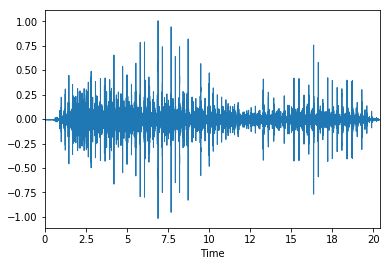

Bark 

90 / 239 instances > 5 seconds


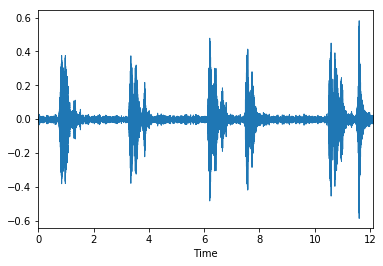

Bus 

45 / 109 instances > 5 seconds


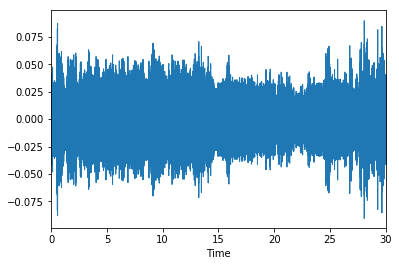

Chime 

33 / 115 instances > 5 seconds


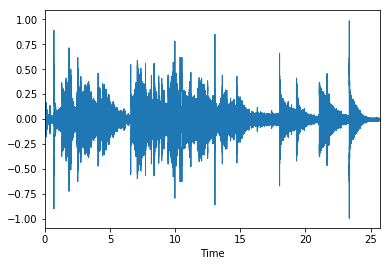

Clarinet 

77 / 300 instances > 5 seconds


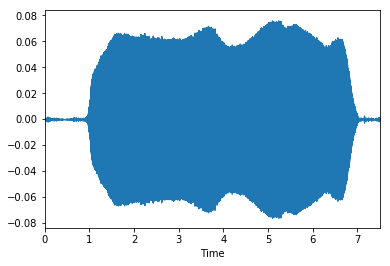

Computer_keyboard 

49 / 119 instances > 5 seconds


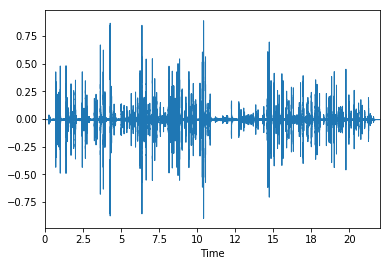

Electric_piano 

32 / 150 instances > 5 seconds


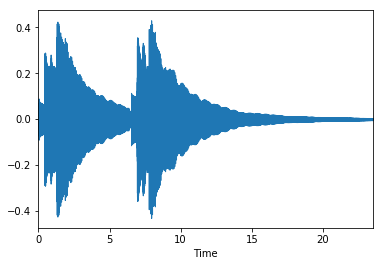

Fireworks 

73 / 300 instances > 5 seconds


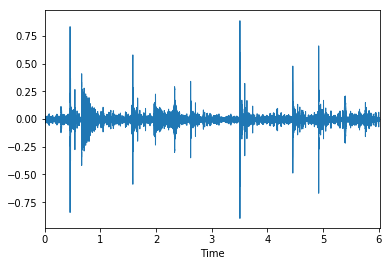

Flute 

82 / 300 instances > 5 seconds


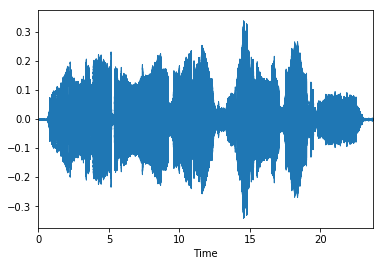

Microwave_oven 

36 / 146 instances > 5 seconds


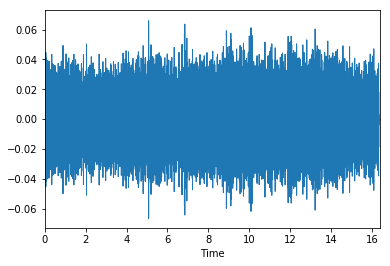

Saxophone 

93 / 300 instances > 5 seconds


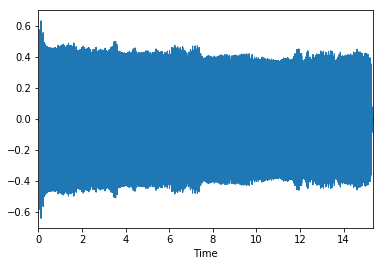

Scissors 

26 / 95 instances > 5 seconds


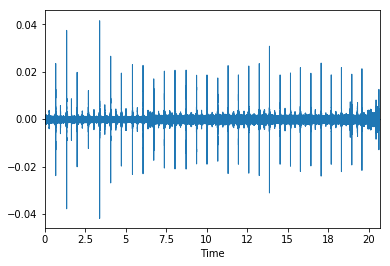

Telephone 

50 / 120 instances > 5 seconds


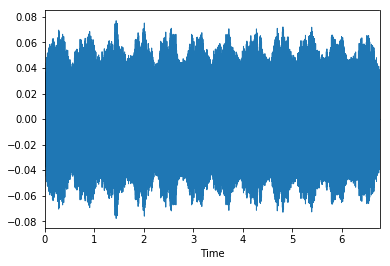

Writing 

88 / 270 instances > 5 seconds


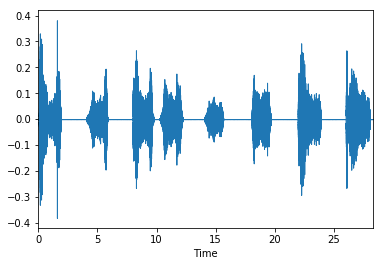

In [183]:
import librosa.display as display
from IPython.display import Audio
import IPython.display

for label in insights['labels_high_80th']:
    data_class = temp[temp['label']==label]
    long_instances = data_class[data_class['audio_length']>5]
    print(label+' \n')
    print('{} / {} instances > 5 seconds'.format(long_instances.shape[0],data_class.shape[0]))
    fname = long_instances.sample(n=1)['fname'].values[0]
    y, sr = librosa.load(osp.join(data_dir,fname), res_type='kaiser_fast')
    display.waveplot(y,sr)
    plt.show()
    IPython.display.display(Audio(data=y,rate=sr))
    



Generally, cutting a 5 seconds-sample into those extracts should not be a problem. In the following, our goal will be to preserve at least 80% of each class by chopping into a minimum amount of the audio samples. All will be integrated the following parsers.

## Data preprocessing & features gathering

The first try will be a greedy one: we know that for many classes, +80% audio samples won't be chopped. We will chop every audio sample exceeding 5 sec in duration. We will add blanks in the audio file and in the mfcc in order to comply with CNN.

### Gathering raw data

In [461]:
def to_be_chopped(y, sr, blank, length):
    max_size = length - 2*blank
    if len(y)*sr > max_size:
        return True
    return False

def arrange_audio(y, sr, blank, length):
    max_size = int((length - 2*blank)*sr)
    if len(y)*sr > max_size: # y will be chopped
        n_min = int(np.random.uniform(0,len(y)-max_size-1))
        y = y[n_min:n_min+max_size]
    y_arranged = np.zeros(length*sr)
    y_arranged[int(blank*sr):int(blank*sr+len(y))] = y
    return y_arranged

def arrange_mfcc(mfcc, nblank):
    n_mfcc = np.shape(mfcc)[0]
    n_frames = np.shape(mfcc)[1]
    mfcc_arranged = np.zeros((n_mfcc + 2*nblank, n_frames))
    mfcc_arranged[nblank:nblank+n_mfcc,:] = mfcc
    return mfcc_arranged

def arrange_mfcc_2axis(mfcc, nblank_mfcc, nblank_t, length, hop_size):
    n_t = int(length / hop_size)
    max_size = n_t - 2*nblank_t
    n_mfcc = np.shape(mfcc)[0]
    n_frames = np.shape(mfcc)[1]
    if(n_frames > max_size): #mfcc will be chopped
        n_min = int(np.random.uniform(0,n_t - (max_size+nblank_t)))
        mfcc = mfcc[:,n_min:n_min+max_size]
        n_frames = max_size
    mfcc_arranged = np.zeros((n_mfcc + 2*nblank_mfcc, n_t))
    mfcc_arranged[nblank_mfcc:nblank_mfcc+n_mfcc,nblank_t:nblank_t+n_frames] = mfcc
    return mfcc_arranged
    

def parser_mfcc_raw_cnn(y, 
                        sr, 
                        n_mfcc=20, 
                        n_frames=None, 
                        hop_size=15e-3, 
                        window_size=25e-3, 
                        verbose=False,
                        audio_length=5.5,
                        nblank_t=2,
                        nblank_mfcc=2):
    if n_frames is not None:  # If n_frames is specified
        assert n_frames >= 1, 'The \'n_frames\' argument should be a strictly positive integer.'
        if verbose:
            print('n_frames specified. Using a fixed number of frames n_frames={}'.format(n_frames))
        if n_frames > 1:
            hop_len = len(y) // (n_frames - 1)
        elif n_frames == 1:
            hop_len = len(y) + 1
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_len)
        return mfcc

    else:
        # Librosa needs the hop_size and the window size in number of points. Thus the conversion
        hop_size_pt = int(hop_size * sr)
        window_size_pt = int(window_size * sr)
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, hop_length=hop_size_pt, n_fft=window_size_pt)
        mfcc = arrange_mfcc_2axis(mfcc,nblank_mfcc,nblank_t,audio_length,hop_size)
        return mfcc


def parser_mfcc_cnn(row,
                  data_directory_path,
                  n_frames=None,
                  hop_size=15e-3,
                  window_size=25e-3,
                  n_mfcc=20,
                  pickled_audio=False,
                  trim=True,
                  db_cutoff=3,
                  audio_length=5.5):
    
    file_name = osp.join(data_directory_path, row['fname'])
    try:
        # here kaiser_fast is a technique used for faster extraction
        if not pickled_audio:
            X, sample_rate = librosa.load(file_name, res_type='kaiser_fast')
        else:
            X, sample_rate = load_pickled_audio(row['fname'], data_directory_path)
        # we extract mfcc feature from data
        
        if trim:
            X = librosa.effects.trim(X, top_db=db_cutoff)[0]
            
        mfccs = parser_mfcc_raw_cnn(y=X, sr=sample_rate, n_frames=n_frames,
                                    n_mfcc=n_mfcc, hop_size=hop_size, window_size=window_size,
                                    audio_length=audio_length)

    except Exception as e:
        print('Error encountered while parsing the file:',file_name)
        print(e)
        return 'None'

    return mfccs

In [382]:
print(train.shape)

(9473, 3)


20 random samples from class Burping_or_eructation


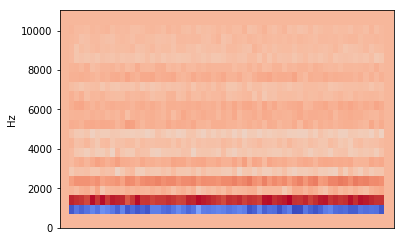

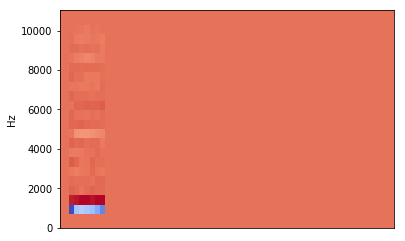

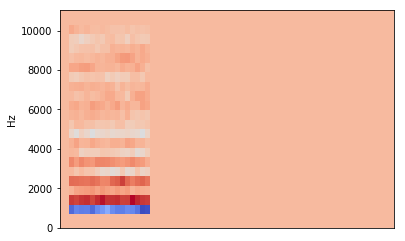

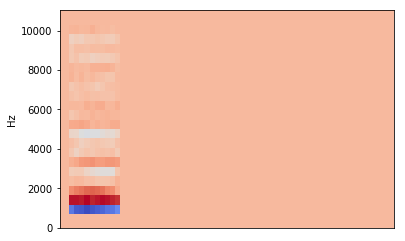

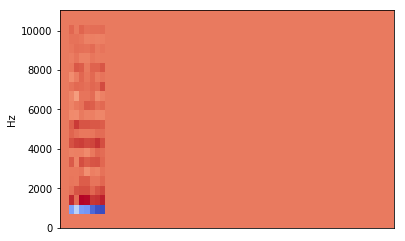

...

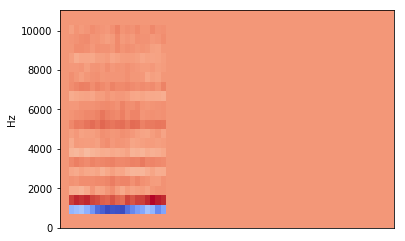

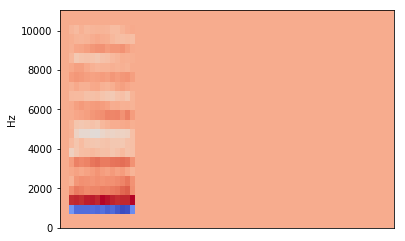

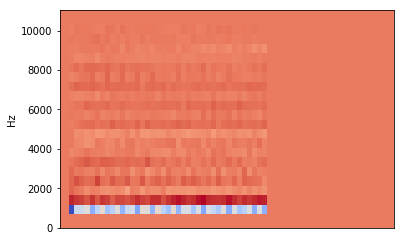

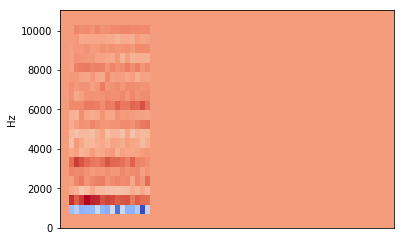

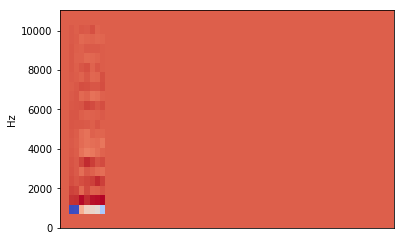

In [482]:
from librosa import display

test_label = list_labels[4]
n_label = 20
train_class = train[train['label']==test_label].copy()
n_samp = train_class.shape[0]
print('{} random samples from class {}'.format(n_label, test_label))
for i in range(n_label):
    fname = train_class.sample(n=1)['fname'].values[0]
    f_path = os.path.join(datapath,'audio_train',fname)
    X0, sample_rate = librosa.load(f_path, res_type='kaiser_fast')
    X = librosa.effects.trim(X0, top_db=3)[0]
    mfccs = parser_mfcc_raw_cnn(y=X, sr=sample_rate,nblank_t=2,audio_length=1)
    plt.plot()
    librosa.display.specshow(mfccs, y_axis='linear')
    plt.show()

** WARNING ! Do not execute the following cell if you want to load pickled data**

In [484]:
#the following dict is convenient to use for the "apply" that come after that)
#data_path = osp.join('data_pie','audio_train') # To be changed according to YOUR data directory
kwargs = {'data_directory_path': data_dir,  
          'n_mfcc': 46,
          'trim': True,
          'audio_length': 1}

#train_extract = train[:10] #to try on a small subset
x = train.apply(lambda x : parser_mfcc_cnn(x, **kwargs),axis=1)
# => We may want to use another feature, just change the parser used in the function above

X = np.array(x.tolist())
print("Shape of the data set : {}".format(X.shape))

Shape of the data set : (9473, 50, 66)


In [424]:
Y = train['label']
list_labels = train.label.unique()
list_labels.sort()

In [485]:
#Saving heavy data to gain time
import pickle
import os.path
fname = 'store_46mfcc_1sec_cnn.pckl'

if os.path.isfile(fname):
    f = open(fname, 'rb')
    X = pickle.load(f)
else:
    f = open(fname, 'wb')
    pickle.dump(X, f)
f.close

<function BufferedWriter.close>

### Preprocessing: do we really need it?

In [419]:
X_flattened = np.array([X[i].ravel().tolist() for i in range(X.shape[0])])
#print(X_flattened.shape)
X_scaled_flat = scale(X_flattened)
X_scaled = np.reshape(X_scaled_flat,X.shape)

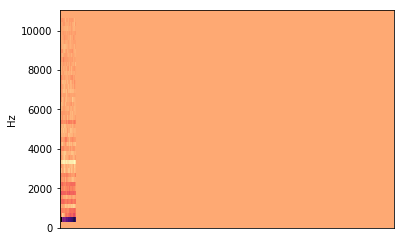

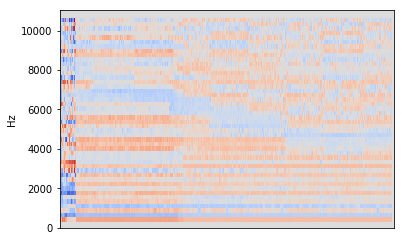

In [420]:
sample = X[0]
sample_scaled = X_scaled[0]

librosa.display.specshow(sample, y_axis='linear')
plt.show()
librosa.display.specshow(sample_scaled, y_axis='linear')
plt.show()

=> That's why we may not want to scale mfccs spectograms. However, thinking about it, it should not be a problem because each feature has the same "meaning", it is a problem quite symetrical in term of the features.

In [421]:
#One hot encoding Y
label_encoder = LabelEncoder()
Y_cat = label_encoder.fit_transform(Y)

### Extracting training and test sets

In [486]:
X = X.reshape(tuple(list(X.shape) + [1]))
X_train, X_test, y_train, y_test = train_test_split(X, Y_cat, stratify=Y_cat, test_size=0.10)

#Useful for NN
y_train_ohe = to_categorical(y_train)
y_test_ohe = to_categorical(y_test)

## Training a neural network

### Training and predicting

In [487]:
X.shape

(9473, 50, 66, 1)

In [488]:
from keras import optimizers, losses, activations, models
from keras.layers import Convolution2D, Dense, Input, Flatten, Dropout, MaxPooling2D, BatchNormalization

input_shape = (50,66,1)
nclass = len(list_labels)
inp = Input(shape=input_shape)
#norm_inp = BatchNormalization()(inp) # we don't normalize for the moment
img_1 = Convolution2D(8, kernel_size=2, activation=activations.relu)(inp)
img_1 = Convolution2D(8, kernel_size=2, activation=activations.relu)(img_1)
img_1 = MaxPooling2D(pool_size=(2, 2))(img_1)
img_1 = Dropout(rate=0.2)(img_1)
img_1 = Convolution2D(16, kernel_size=3, activation=activations.relu)(img_1)
img_1 = Convolution2D(16, kernel_size=3, activation=activations.relu)(img_1)
img_1 = MaxPooling2D(pool_size=(2, 2))(img_1)
img_1 = Dropout(rate=0.2)(img_1)
img_1 = Convolution2D(32, kernel_size=3, activation=activations.relu)(img_1)
img_1 = MaxPooling2D(pool_size=(2, 2))(img_1)
img_1 = Dropout(rate=0.2)(img_1)
img_1 = Flatten()(img_1)

dense_1 = BatchNormalization()(Dense(128, activation=activations.relu)(img_1))
dense_1 = BatchNormalization()(Dense(128, activation=activations.relu)(dense_1))
dense_1 = Dense(nclass, activation=activations.softmax)(dense_1)

model = models.Model(inputs=inp, outputs=dense_1)
opt = optimizers.Adam()

In [489]:
def top3_acc(ytrue, ypred):
    return metrics.top_k_categorical_accuracy(ytrue, ypred, k=3)

model.compile(loss=losses.categorical_crossentropy,
              optimizer=optimizers.Adam(),
              metrics=[metrics.categorical_accuracy, top3_acc])

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 50, 66, 1)         0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 49, 65, 8)         40        
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 48, 64, 8)         264       
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 24, 32, 8)         0         
_________________________________________________________________
dropout_11 (Dropout)         (None, 24, 32, 8)         0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 22, 30, 16)        1168      
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 20, 28, 16)        2320      
__________

In [490]:
# Here the split is done in the fit method, so we can follow the validation loss/acc in real time too
history = model.fit(X_train, y_train_ohe, epochs=30, batch_size=32, validation_data=[X_test, y_test_ohe])

Train on 8525 samples, validate on 948 samples
Epoch 1/30
8525/8525 [==============================] - 214s 25ms/step - loss: 3.3097 - categorical_accuracy: 0.1405 - top3_acc: 0.2949 - val_loss: 3.0919 - val_categorical_accuracy: 0.1646 - val_top3_acc: 0.3681
Epoch 2/30
8525/8525 [==============================] - 205s 24ms/step - loss: 2.6633 - categorical_accuracy: 0.2453 - top3_acc: 0.4796 - val_loss: 2.7453 - val_categorical_accuracy: 0.2532 - val_top3_acc: 0.4852
Epoch 3/30
8525/8525 [==============================] - 203s 24ms/step - loss: 2.4011 - categorical_accuracy: 0.3184 - top3_acc: 0.5670 - val_loss: 2.8638 - val_categorical_accuracy: 0.2342 - val_top3_acc: 0.4473
Epoch 4/30
8525/8525 [==============================] - 203s 24ms/step - loss: 2.2477 - categorical_accuracy: 0.3558 - top3_acc: 0.6126 - val_loss: 2.6364 - val_categorical_accuracy: 0.2764 - val_top3_acc: 0.5053
Epoch 5/30
8525/8525 [==============================] - 202s 24ms/step - loss: 2.1378 - categorical_a

In [493]:
model.save('cnn_46mfcc_1sec.model')

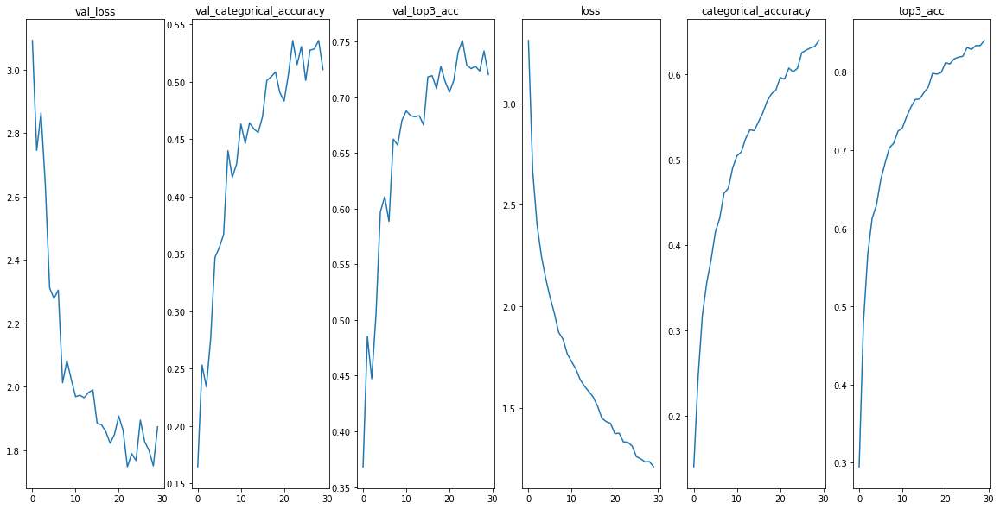

In [491]:
plt.figure(figsize=(20,10))

for i, (name, values) in enumerate(history.history.items()):
    plt.subplot(1, len(history.history.items()), i+1)
    plt.plot(values)
    plt.title(name)

### Assessing accuracy

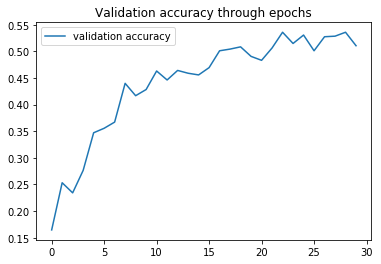

In [492]:
plt.figure()
plt.plot(history.history['val_categorical_accuracy'], label='validation accuracy')
plt.title("Validation accuracy through epochs")
plt.legend()

In [499]:
pred = model.predict(X_test)

In [500]:
print(np.shape(pred))
#print(pred[0])
prediction = np.argmax(pred, axis=1)
print(prediction[0])

(948, 41)
36


In [497]:
prediction[1]

36

In [501]:
print("Accuracy: ")
print(accuracy_score(y_test, prediction))
print("\n\n")
print("Confusion matrix: ")
print(confusion_matrix(y_test, prediction))
print("\n\n")
print(classification_report(y_test, prediction, target_names=list_labels))

Accuracy: 
0.510548523206751



Confusion matrix: 
[[18  0  0 ...  0  0  0]
 [ 0 23  1 ...  0  0  0]
 [ 0  2 14 ...  0  0  0]
 ...
 [ 0  0  0 ... 14  0  1]
 [ 2  0  0 ...  1 16  0]
 [ 0  0  0 ...  0  0  8]]



                       precision    recall  f1-score   support

      Acoustic_guitar       0.62      0.60      0.61        30
             Applause       0.66      0.77      0.71        30
                 Bark       0.52      0.58      0.55        24
            Bass_drum       0.79      0.73      0.76        30
Burping_or_eructation       0.76      0.76      0.76        21
                  Bus       0.24      0.36      0.29        11
                Cello       0.52      0.40      0.45        30
                Chime       0.40      0.18      0.25        11
             Clarinet       0.89      0.53      0.67        30
    Computer_keyboard       0.50      0.25      0.33        12
                Cough       0.55      0.46      0.50        24
              Cowbell       0.74 

In [503]:
pred = model.predict(X_train)
prediction_train = np.argmax(pred, axis=1)

In [504]:
print("Accuracy: ")
print(accuracy_score(y_train, prediction_train))
print("\n\n")
print("Confusion matrix: ")
print(confusion_matrix(y_train, prediction_train))
print("\n\n")
print(classification_report(y_train, prediction_train, target_names=list_labels))

Accuracy: 
0.6775366568914956



Confusion matrix: 
[[225   0   0 ...   0   0   0]
 [  2 250   1 ...   0   1   0]
 [  0  11 161 ...   0   1   1]
 ...
 [  2   0   1 ... 199   0   7]
 [  3   1   0 ...   3 223   0]
 [  0   3   0 ...   0   0  84]]



                       precision    recall  f1-score   support

      Acoustic_guitar       0.80      0.83      0.81       270
             Applause       0.82      0.93      0.87       270
                 Bark       0.81      0.75      0.78       215
            Bass_drum       0.83      0.86      0.85       270
Burping_or_eructation       0.93      0.81      0.86       189
                  Bus       0.53      0.62      0.57        98
                Cello       0.82      0.68      0.74       270
                Chime       0.92      0.58      0.71       104
             Clarinet       0.99      0.58      0.73       270
    Computer_keyboard       0.76      0.27      0.40       107
                Cough       0.80      0.73      0.77       